# **---- EDA sur un nouveau dataset ----**

Rapport du groupe : Rémi JORGE, Alexandre DELOIRE, Jiayi HE

#### Imports

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.manifold import TSNE
from sklearn.metrics import classification_report, confusion_matrix, silhouette_score, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import MinMaxScaler, StandardScaler


## <span style="color:orange"> **1 - Data Type Analysis (What ?)**

Dans cette section, il est important de comprendre la structure de base des données, leur type et leur qualité. L’objectif est de répondre à la question "Quelles sont les caractéristiques des données avec lesquelles nous travaillons ?"

### **Analyse**

#### 1.1 Types de Features

In [ ]:
df = pd.read_csv('data/TP noté/exercise_angles.csv')

print(f"There are {df.shape[0]} rows and {df.shape[1]} columns")

df.head(5)

There are 31033 rows and 12 columns


,Side,Shoulder_Angle,Elbow_Angle,Hip_Angle,Knee_Angle,Ankle_Angle,Shoulder_Ground_Angle,Elbow_Ground_Angle,Hip_Ground_Angle,Knee_Ground_Angle,Ankle_Ground_Angle,Label
0,left,10.639208,174.466813,174.785143,179.848140,179.419276,90.0,90.0,90.0,90.0,90.0,Jumping Jacks
1,left,10.590342,174.428706,174.765042,179.775215,179.386147,90.0,90.0,90.0,90.0,90.0,Jumping Jacks
2,left,10.546746,174.489431,174.785790,179.660017,179.333710,90.0,90.0,90.0,90.0,90.0,Jumping Jacks
3,left,10.487682,174.614913,174.759542,179.614223,179.313926,90.0,90.0,90.0,90.0,90.0,Jumping Jacks
4,left,10.412107,174.758503,174.737721,179.570564,179.298805,90.0,90.0,90.0,90.0,90.0,Jumping Jacks


In [ ]:
df.dtypes

Side                      object
Shoulder_Angle           float64
Elbow_Angle              float64
Hip_Angle                float64
Knee_Angle               float64
Ankle_Angle              float64
Shoulder_Ground_Angle    float64
Elbow_Ground_Angle       float64
Hip_Ground_Angle         float64
Knee_Ground_Angle        float64
Ankle_Ground_Angle       float64
Label                     object
TSNE1                    float32
TSNE2                    float32
TSNE1_PCA                float32
TSNE2_PCA                float32
dtype: object

#### 1.2 Homogénéité des données

L’objectif est de vérifier l’homogénéité des données en observant la distribution des features à l’aide de graphiques tels que des histogrammes et des boxplots.

##### Étape 1 : Distribution des valeurs pour chaque feature

In [ ]:
df.describe()

,Shoulder_Angle,Elbow_Angle,Hip_Angle,Knee_Angle,Ankle_Angle,Shoulder_Ground_Angle,Elbow_Ground_Angle,Hip_Ground_Angle,Knee_Ground_Angle,Ankle_Ground_Angle
count,31033.000000,31033.000000,31033.000000,31033.000000,31033.000000,31033.000000,31033.000000,31033.000000,31033.000000,31033.000000
mean,66.522206,114.303010,137.466151,143.273623,135.211957,88.816743,88.926949,79.408694,75.795121,68.985596
std,60.226756,57.906279,57.048278,48.041715,53.304068,14.546233,13.856550,42.359381,48.530150,57.802208
min,0.002748,0.000974,0.006850,0.116036,0.031297,-90.000000,-90.000000,-90.000000,-90.000000,-90.000000
25%,17.852184,58.900491,111.556724,123.646144,106.740814,90.000000,90.000000,90.000000,90.000000,90.000000
50%,40.585632,132.999090,168.374922,168.227063,162.926184,90.000000,90.000000,90.000000,90.000000,90.000000
75%,121.209005,168.769517,175.656498,177.225089,175.735039,90.000000,90.000000,90.000000,90.000000,90.000000
max,179.991577,179.998861,179.999848,179.999277,179.999942,90.000000,90.000000,90.000000,90.000000,90.000000


Les boxplots sont  utiles pour repérer les valeurs aberrantes (outliers) et visualiser la médiane, les quartiles, et la dispersion des données.

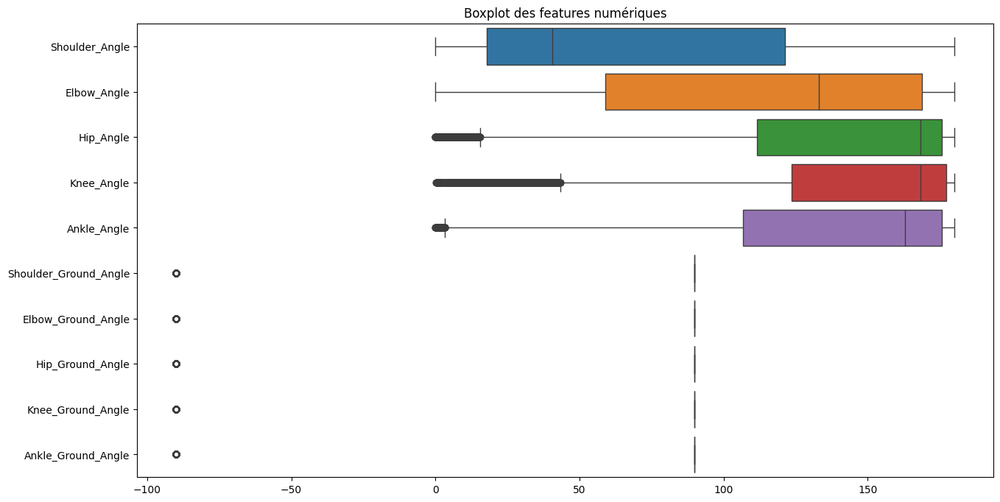

In [ ]:
df_numeric = df.select_dtypes(include=['float64', 'int64'])

plt.figure(figsize=(15, 8))
sns.boxplot(data=df_numeric, orient='h')
plt.title('Boxplot des features numériques')
plt.show()


On remarque de suite que les valeurs des angles par rapport au sol sont en très grande majorité à 90 degrés. Ils apporteront donc probablement un poids négligeable pour la classification à venir. En revanche, les angles relatifs sont eux compris entre 0 et 180 degrés. En particulié, Shoulder_Angle se distingue des autres angles, sa moyenne se situant autour de 50 degrés, tandis que le Hip, Knee et Ankle ont une moyenne autour de 160 degrés.

Pour visualiser la distribution des données, nous allons utiliser des histogrammes pour chaque variable. Cela permet de détecter des anomalies, des distributions asymétriques ou des valeurs aberrantes. A noter que ces histogrammes sont déjà présenter sur la page kaggle du dataset.

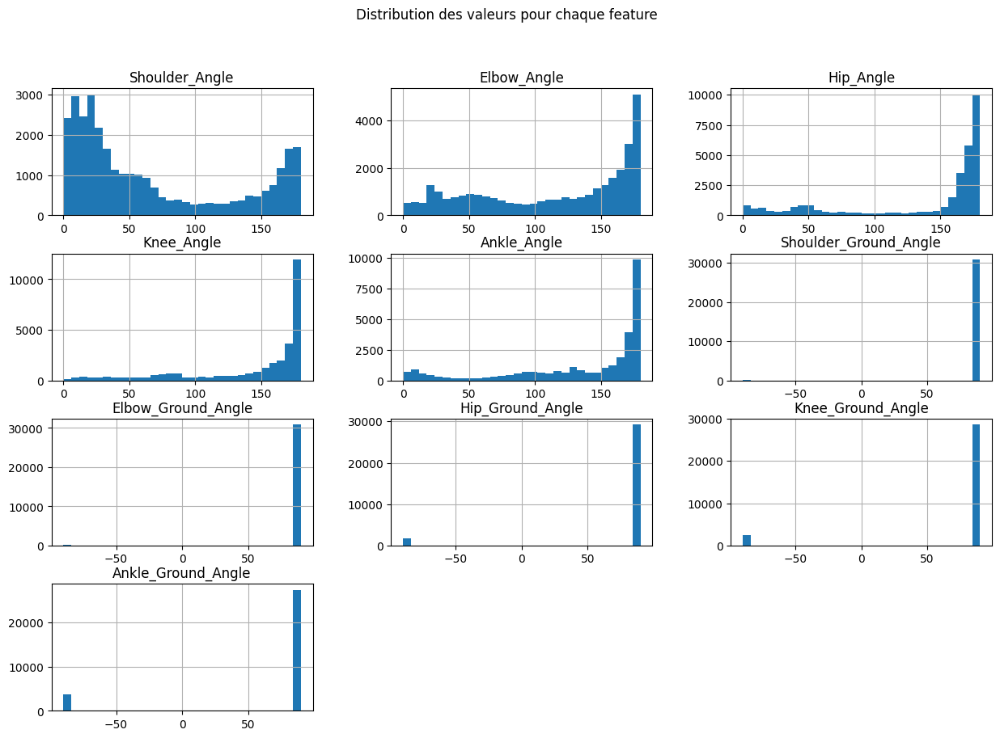

In [ ]:
df_numeric = df.select_dtypes(include=['float64', 'int64'])

df_numeric.hist(figsize=(15, 10), bins=30)
plt.suptitle('Distribution des valeurs pour chaque feature')
plt.show()


##### Comparaison des distributions entre les exercices
On peut visualiser plus en détail la répartition des exercices pour chaque feature, nous les décomposons ci-dessous en graphique individuel.

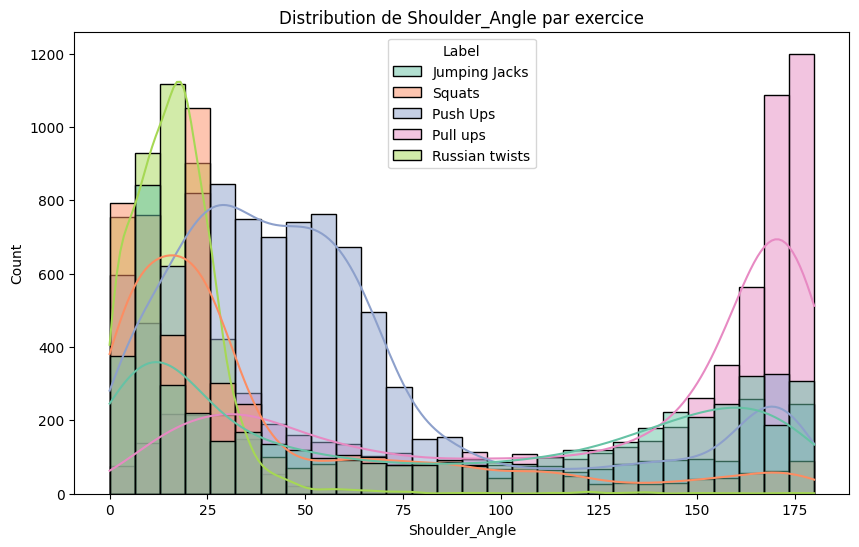

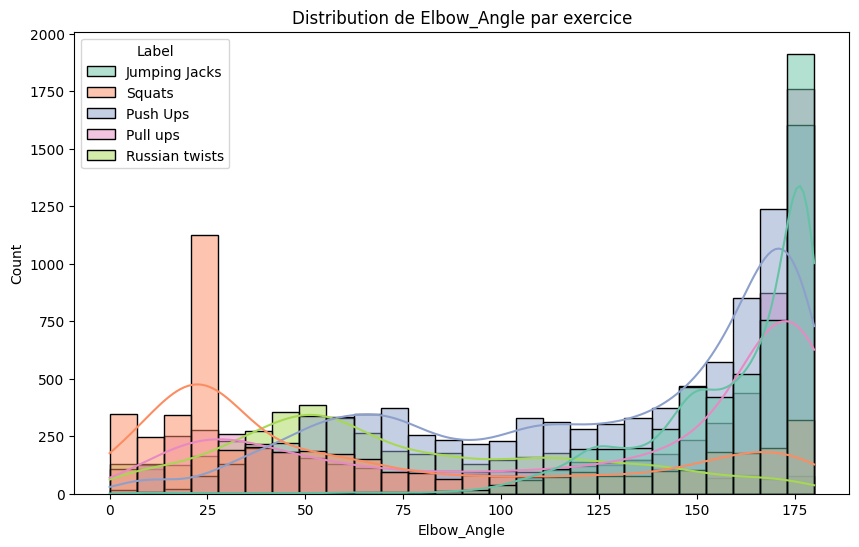

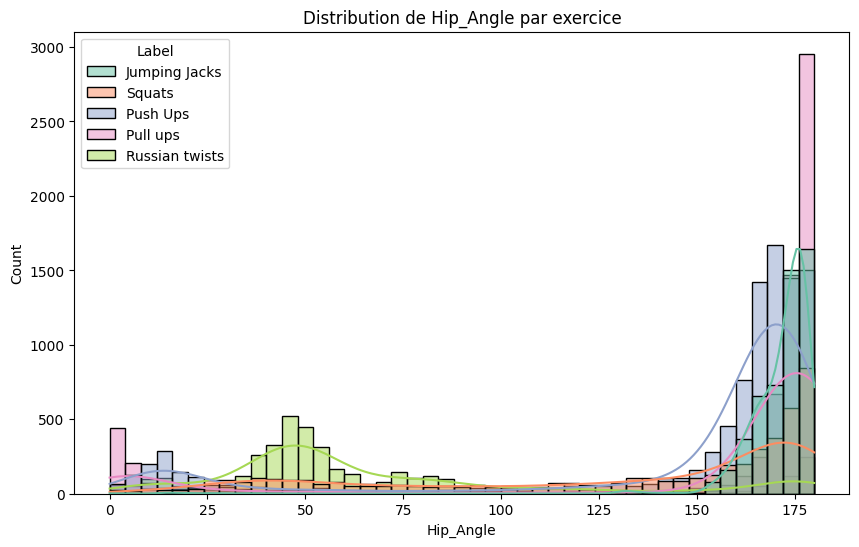

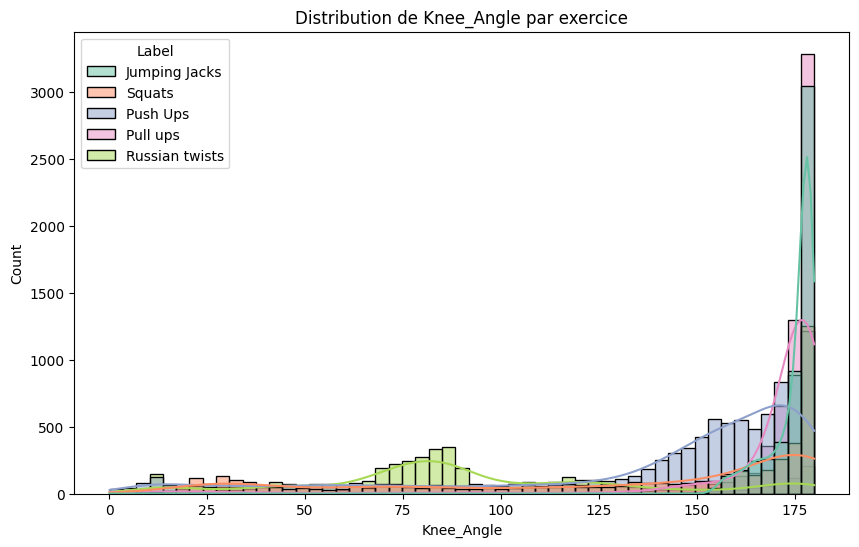

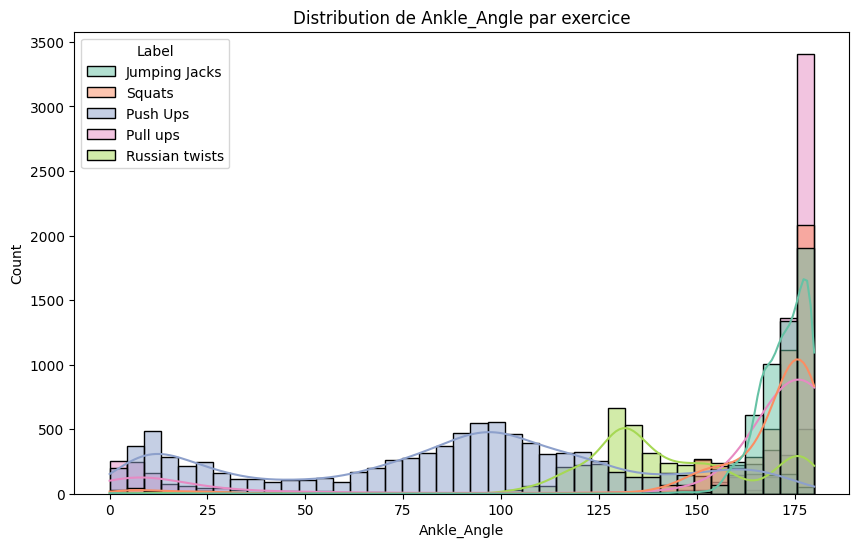

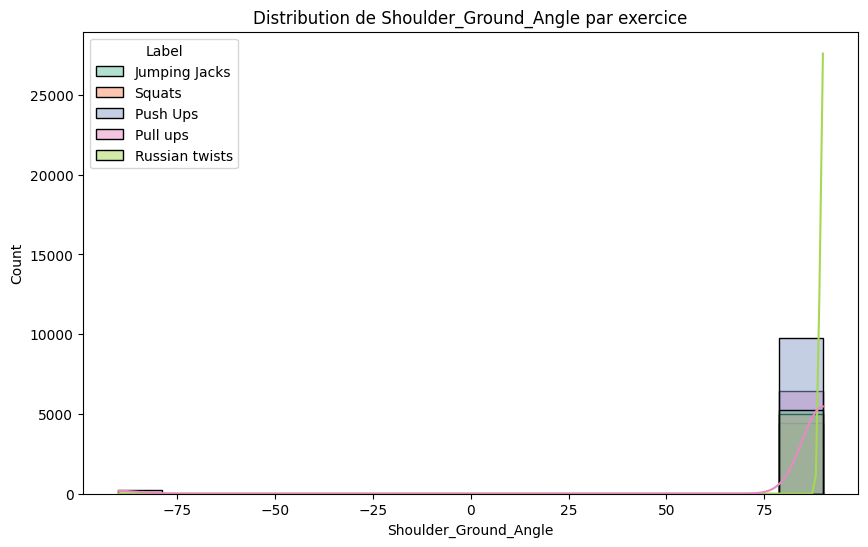

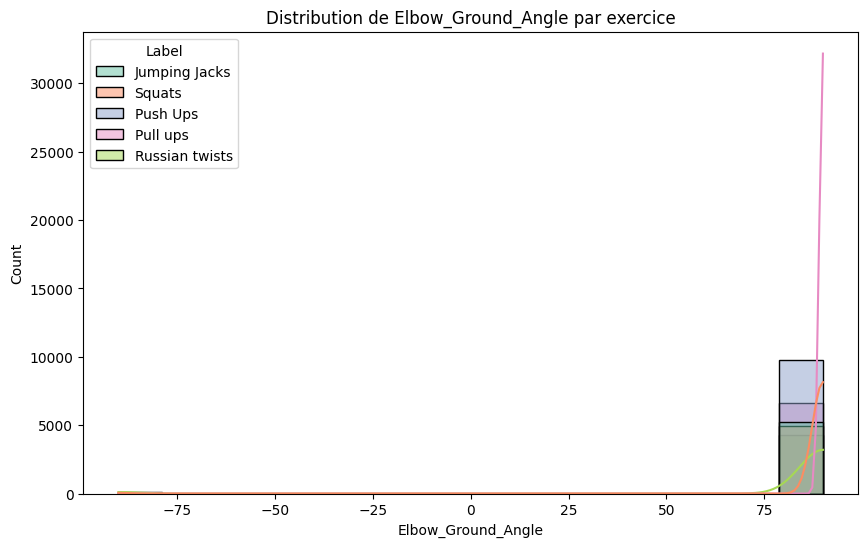

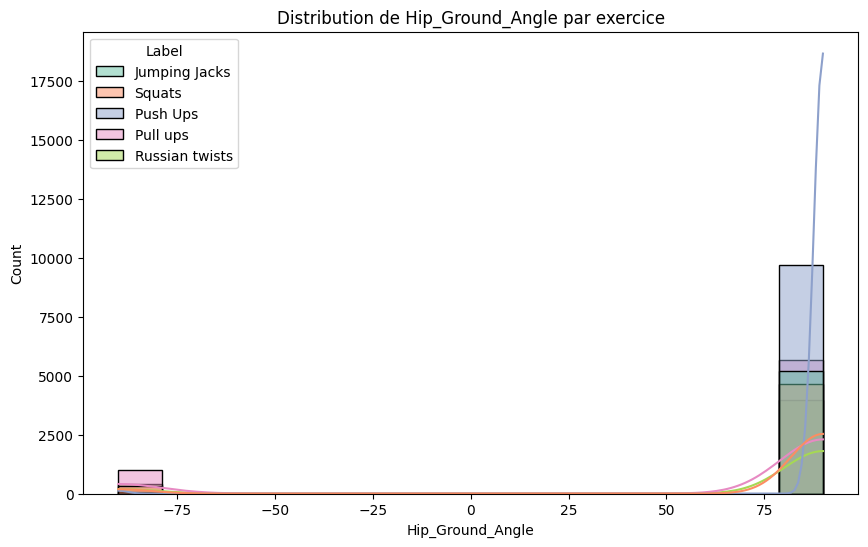

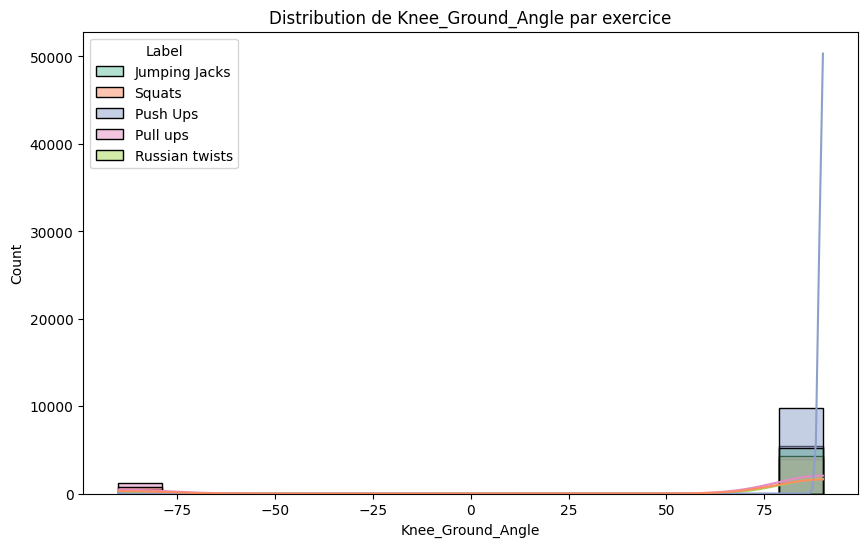

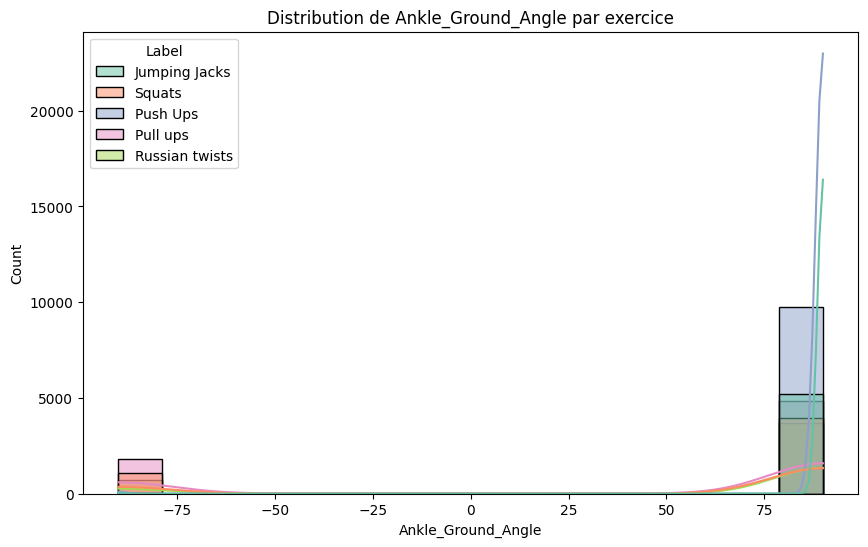

In [ ]:
for column in df_numeric.columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(data=df, x=column, hue='Label', kde=True, palette='Set2')
    plt.title(f'Distribution de {column} par exercice')
    plt.show()


Dans ces premières observations, on constate que les push ups se démarquent des autres exercices facilement, en particulié pour les épaules. Ainsi, les push ups ne poseront pas de problème pour être bien classés et se distinguer dans les clusters. De même, les pull ups ont un angle très élevé pour les épaules.

Une fois de plus on remarque aussi que les angles par rapport au sol ne permettent ni de distinguer, ni d'interpréter beaucoup d'informations pour l'instant.

##### Étape 2 : Visualisation de la répartition des types d'exercices

C:\Users\remij\AppData\Local\Temp\ipykernel_23732\2467631324.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Label', data=df, palette='Set3')


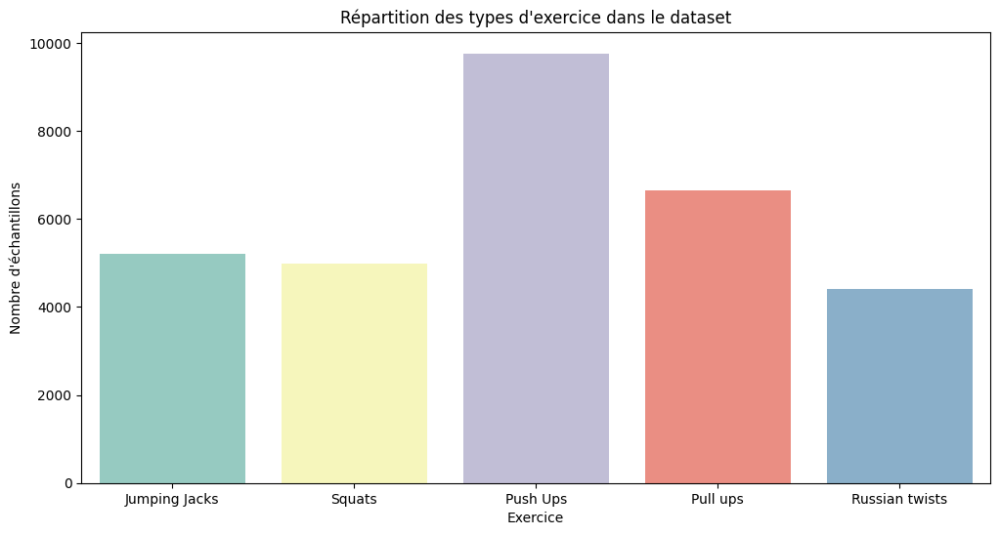

In [ ]:
# Visualisation des distributions des angles par type d'exercice
plt.figure(figsize=(12, 6))
sns.countplot(x='Label', data=df, palette='Set3')
plt.title('Répartition des types d\'exercice dans le dataset')
plt.ylabel('Nombre d\'échantillons')
plt.xlabel('Exercice')
plt.show()


Tous les exercices sont assez bien représentés, les échantillons ont aussi une taille importante. D'où une future classification pertinente.

Le dataset initial présente aussi un paramètre appelé la `Side`, mais après analyse de cette donnée, on constate que toutes les valeurs sont identiques à `left`.

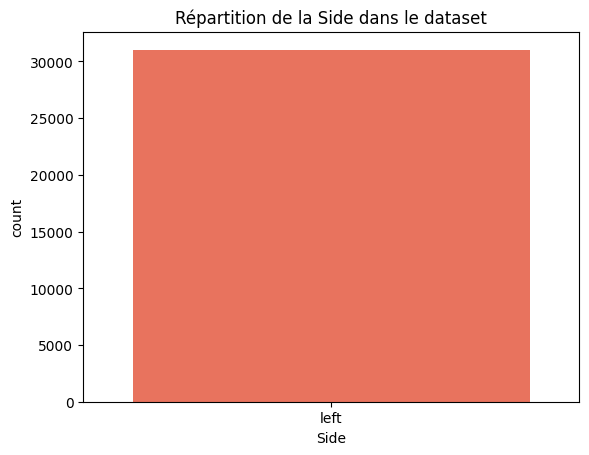

In [ ]:
sns.countplot(data=df, x='Side',color='#FF6347')
plt.title('Répartition de la Side dans le dataset')
plt.show()

Pour conclure, cette première analyse nous visualise les boxplots par attribut et en fonction des exercices. Cette découpe permet de voir rapidement si une feature permet de bien différencier les données entre elles.

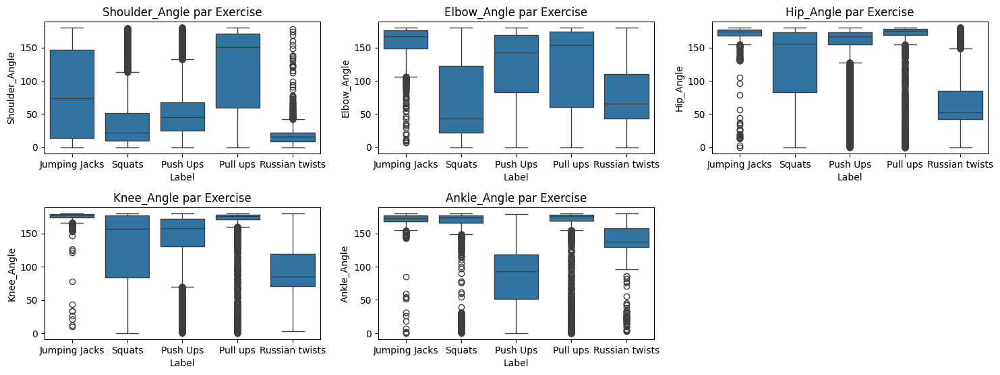

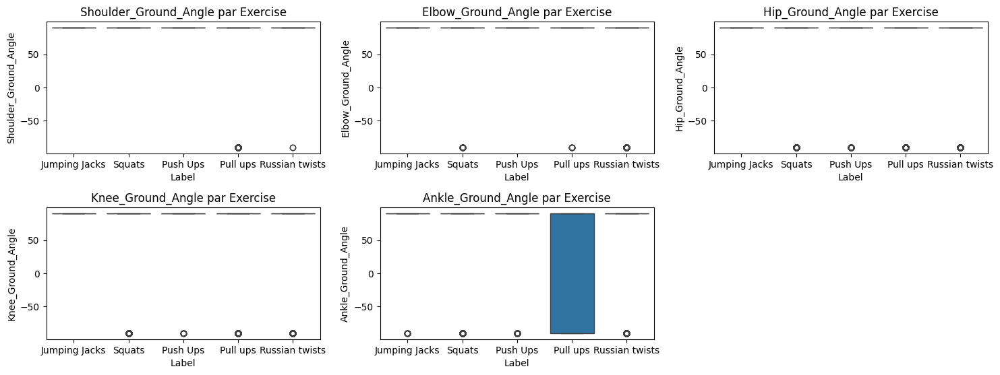

In [ ]:
columns_angle = ['Shoulder_Angle', 'Elbow_Angle', 'Hip_Angle', 'Knee_Angle', 'Ankle_Angle']
columns_ground = ['Shoulder_Ground_Angle', 'Elbow_Ground_Angle', 'Hip_Ground_Angle', 'Knee_Ground_Angle', 'Ankle_Ground_Angle']

plt.figure(figsize=(15, 8))
for column in columns_angle:
    plt.subplot(3, 3, list(columns_angle).index(column) + 1)
    sns.boxplot(x='Label', y=column, data=df)
    plt.title(f'{column} par Exercise')
plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 8))
for column in columns_ground:
    plt.subplot(3, 3, list(columns_ground).index(column) + 1)
    sns.boxplot(x='Label', y=column, data=df)
    plt.title(f'{column} par Exercise')
plt.tight_layout()
plt.show()

Quelques exercices vont être difficiles à différencier comme les pull ups et les jumping jacks. De plus, on constate que `Hip_Angle` et `Knee_Angle` apporte une infomation similaire, mais nous reviendrons dessus dans la partie corrélation.

### **Processing**

#### 1.3 Valeurs manquantes

##### Étape 1 : Vérification des valeurs manquantes

Avant d'aller plus loin, vérifions s'il y a des valeurs manquantes dans le dataset. Si elles existent, nous devons comprendre leur distribution et leur importance.

In [ ]:
missing_values = df.isnull().sum()
missing_values = missing_values[missing_values > 0]
print(missing_values)

Series([], dtype: int64)


On remarque qu'il n'y a pas de valeurs manquantes dans ce dataset.

##### Étape 2 : Traitement des valeurs manquantes

S'il y avait eu des valeurs manquantes nous aurions pu traiter celle-ci avec l'exemple suivant (imputation avec la moyenne) :

In [ ]:
# df.fillna(df.mean(), inplace=True)

## <span style="color:orange"> **2 - Comprendre les features (How ?)**

Dans cette partie, nous nous concentrons sur l’interprétation des features et des relations entre elles. Le but est de comprendre "Comment ces variables interagissent-elles entre elles ?"

### **Analyse**

#### 2.1 Correlations

Nous allons utiliser une matrice de corrélation pour visualiser les relations entre les features.

Explication : La matrice de corrélation permet de visualiser rapidement les relations linéaires entre les variables. Les valeurs proches de 1 ou -1 indiquent une forte corrélation positive ou négative, tandis que des valeurs proches de 0 suggèrent une absence de corrélation.

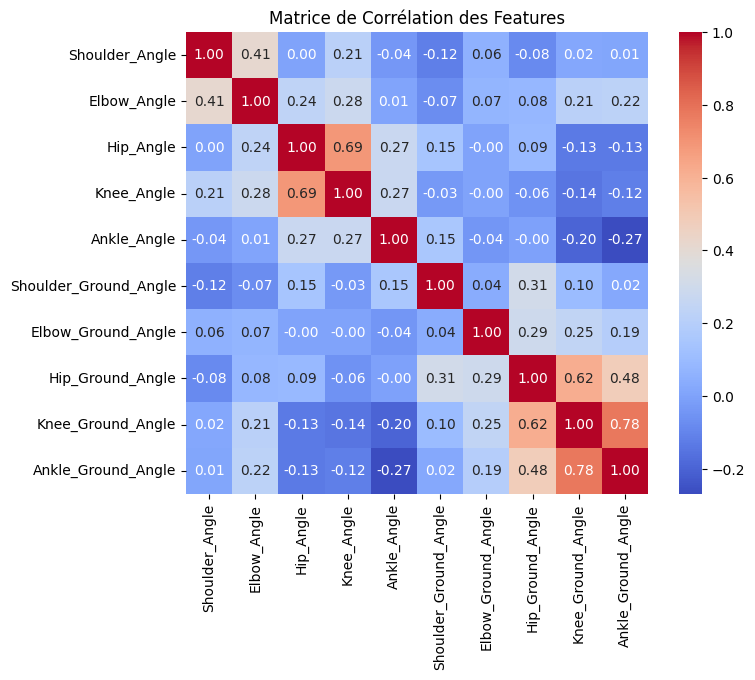

In [ ]:
df_numeric = df.select_dtypes(include=['float64', 'int64'])
correlation_matrix = df_numeric.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Matrice de Corrélation des Features')
plt.show()


Comme nous l'avons suggéré en cours, une correlation négative reste une corrélation. Ainsi, nous nous intéressons à la matrice des correlations en valeur absolue.

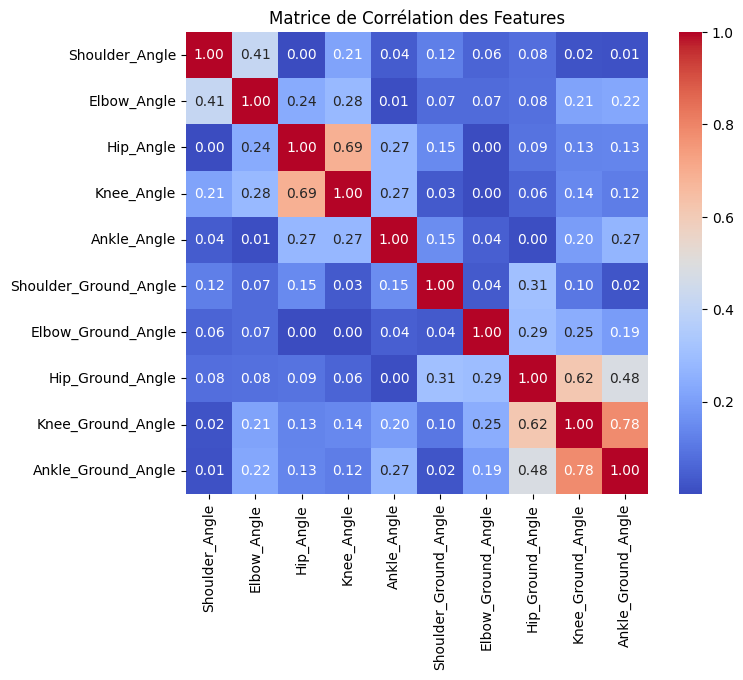

In [ ]:
plt.figure(figsize=(8, 6))
sns.heatmap(abs(correlation_matrix), annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Matrice de Corrélation des Features')
plt.show()

Comme nous l'avons dans la première partie, on voit une forte corrélation entre `Hip_Angle` et `Knee_Angle`, si on prend du recul sur la donnée, cette corrélation semble normale car le genou et les hanches sont des parties du corps proches.

Les angles par rapport au sol ont aussi une forte corrélation car comme on l'a vu beaucoup de ces valeurs sont similaires. On peut toutefois noter la corrélation entre`Ankle_Ground_Angle` avec `Knee_Ground_Angle` et entre `Knee_Ground_Angle` et `Hip_Ground_Angle`: ce sont les trois parties du bas du corps, ce qui explique une certaine cohérence logique.

On pourrait se demander alors pourquoi il n'y pas une plus forte corrélation entre les épaules et le coude (bien que 0.4 reste un bon score). Cela s'explique facilement par le fait que les bras sont beaucoup plus mobiles que les jambes, ce qui entraîne des variations d'angle plus importantes, réduisant ainsi la corrélation.

#### 2.2 Dépendances

L'analyse multivariée permet de mieux comprendre les relations complexes entre plusieurs variables. Nous pouvons utiliser des techniques telles que des `pair plots`.

Explication : Le pair plot montre les relations entre chaque paire de variables, ce qui peut révéler des relations non linéaires ou des clusters dans les données.

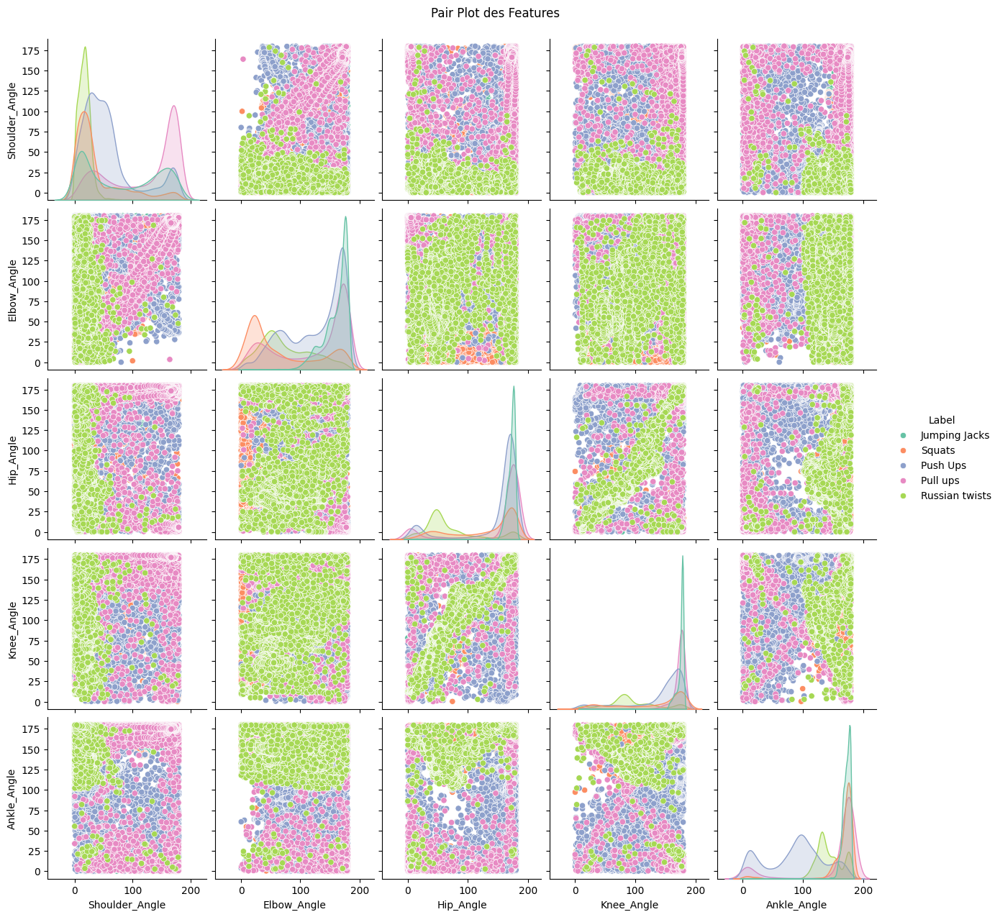

In [ ]:
sns.pairplot(df, vars=['Shoulder_Angle', 'Elbow_Angle', 'Hip_Angle', 'Knee_Angle', 'Ankle_Angle'], hue='Label', palette='Set2')
plt.suptitle('Pair Plot des Features', y=1.02)
plt.show()


Ce graphique permet de consolider les analyses faites précédemment. On retrouve de jolies corrélations entre les parties du bas corps et des corrélations moins évidentes pour les parties du haut du corps.

On constate aussi que les push ups ne montrent pas de forte corrélation entre les variables. On peut en déduire que cet exercice est complet car tous les angles des articulations observées varient beaucoup.

D'autre part, les squats montrent une belle corrélation entre les hanches et les genoux ce qui est une fois de plus logique.

##### Plus de détail

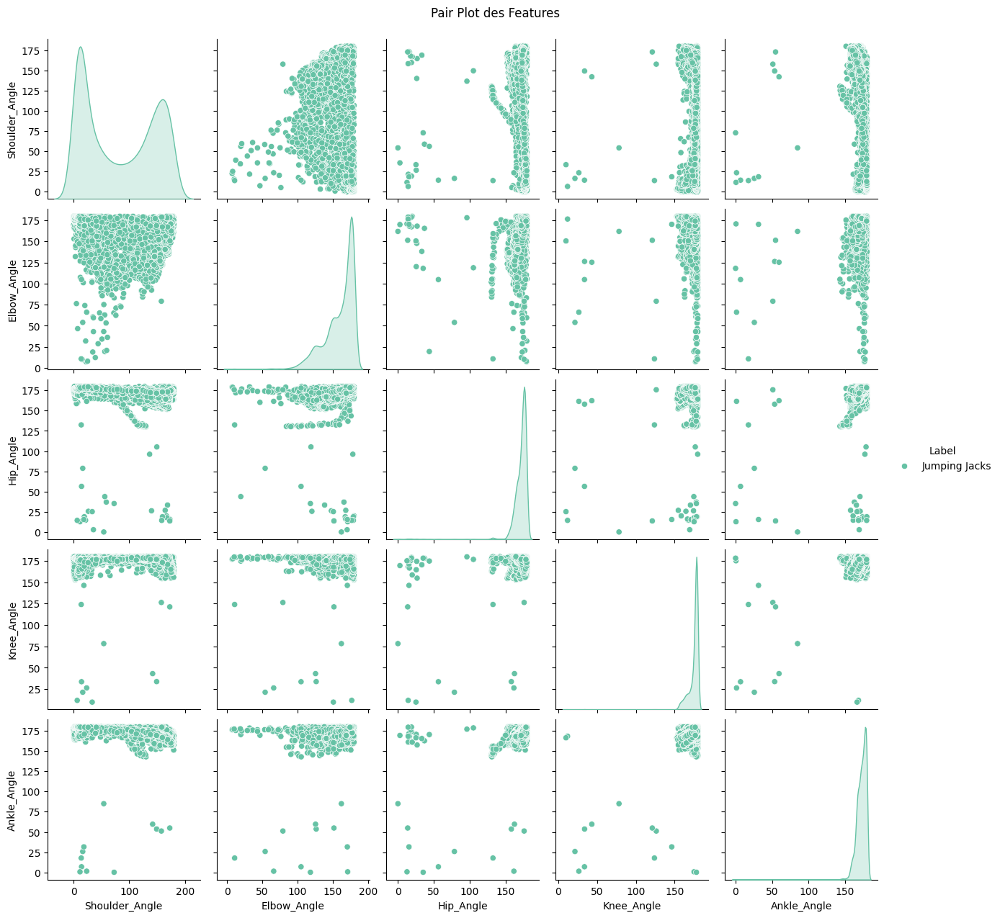

In [ ]:
df_jumping = df[df['Label'] == 'Jumping Jacks']

sns.pairplot(df_jumping, vars=['Shoulder_Angle', 'Elbow_Angle', 'Hip_Angle', 'Knee_Angle', 'Ankle_Angle'], hue='Label', palette='Set2')
plt.suptitle('Pair Plot des Features', y=1.02)
plt.show()

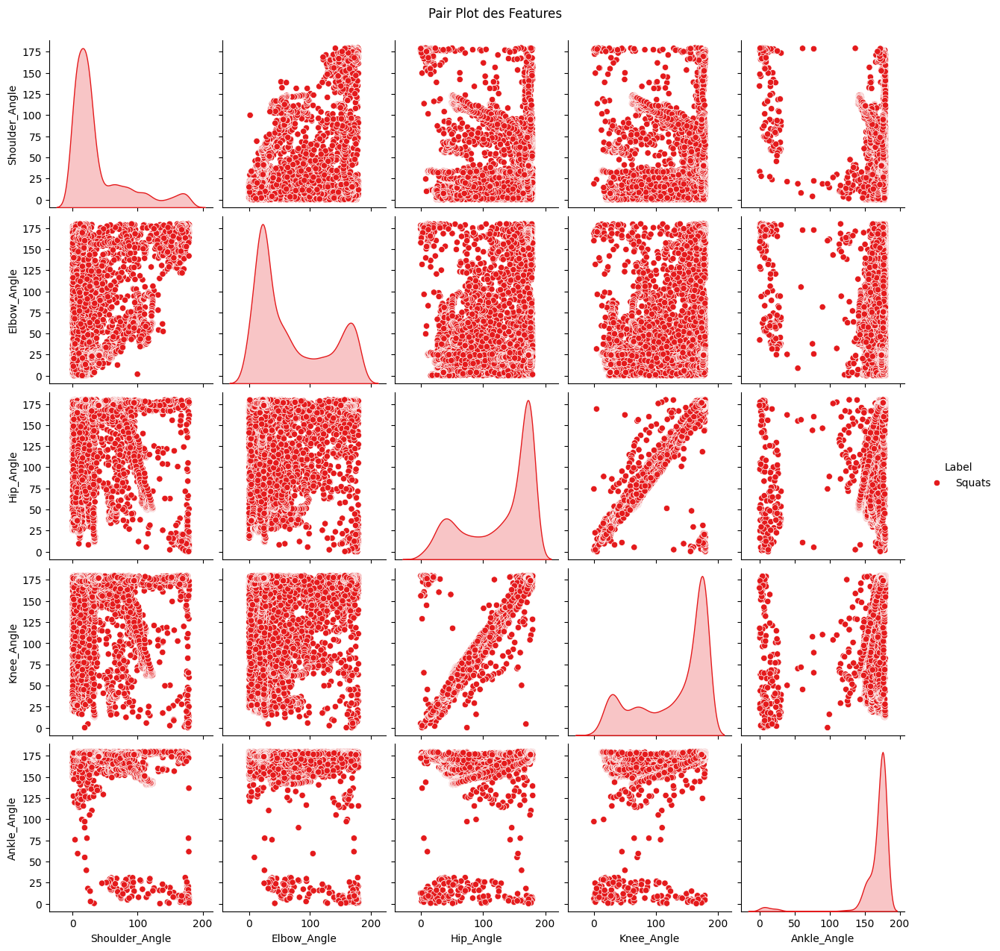

In [ ]:
df_jumping = df[df['Label'] == 'Squats']

sns.pairplot(df_jumping, vars=['Shoulder_Angle', 'Elbow_Angle', 'Hip_Angle', 'Knee_Angle', 'Ankle_Angle'], hue='Label', palette='Set1')
plt.suptitle('Pair Plot des Features', y=1.02)
plt.show()

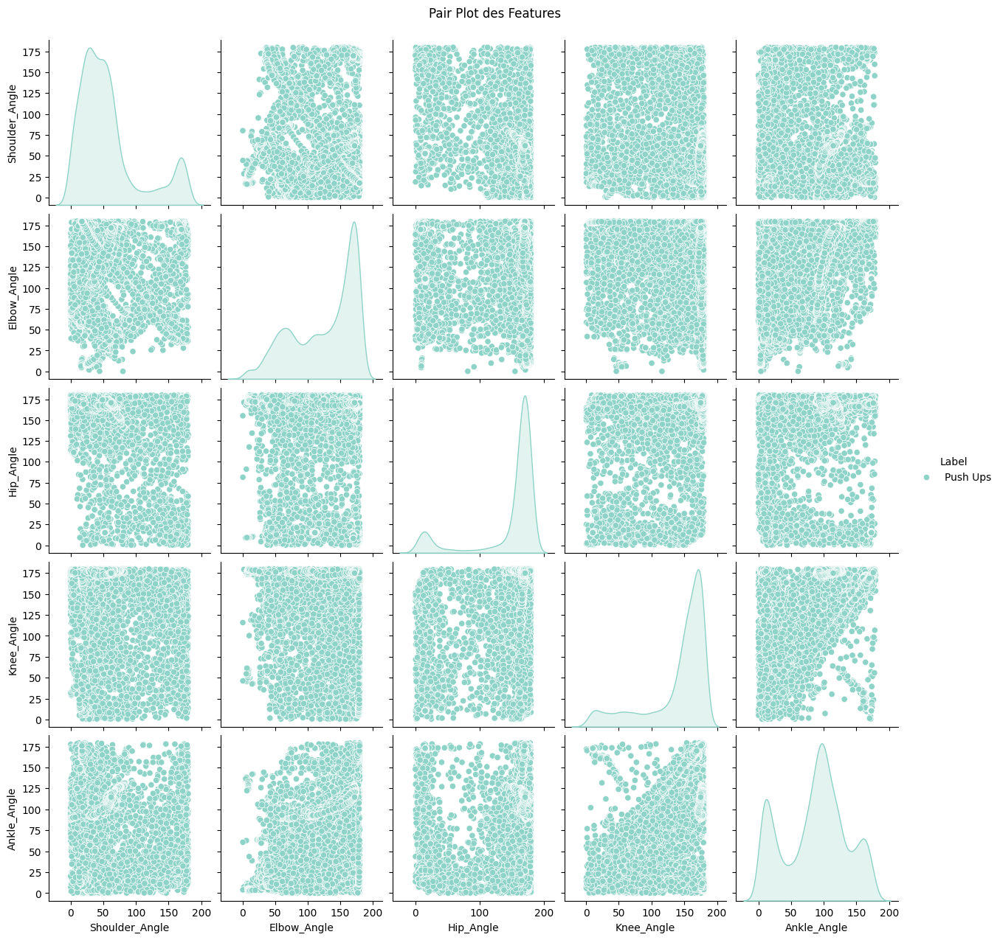

In [ ]:
df_jumping = df[df['Label'] == 'Push Ups']

sns.pairplot(df_jumping, vars=['Shoulder_Angle', 'Elbow_Angle', 'Hip_Angle', 'Knee_Angle', 'Ankle_Angle'], hue='Label', palette='Set3')
plt.suptitle('Pair Plot des Features', y=1.02)
plt.show()

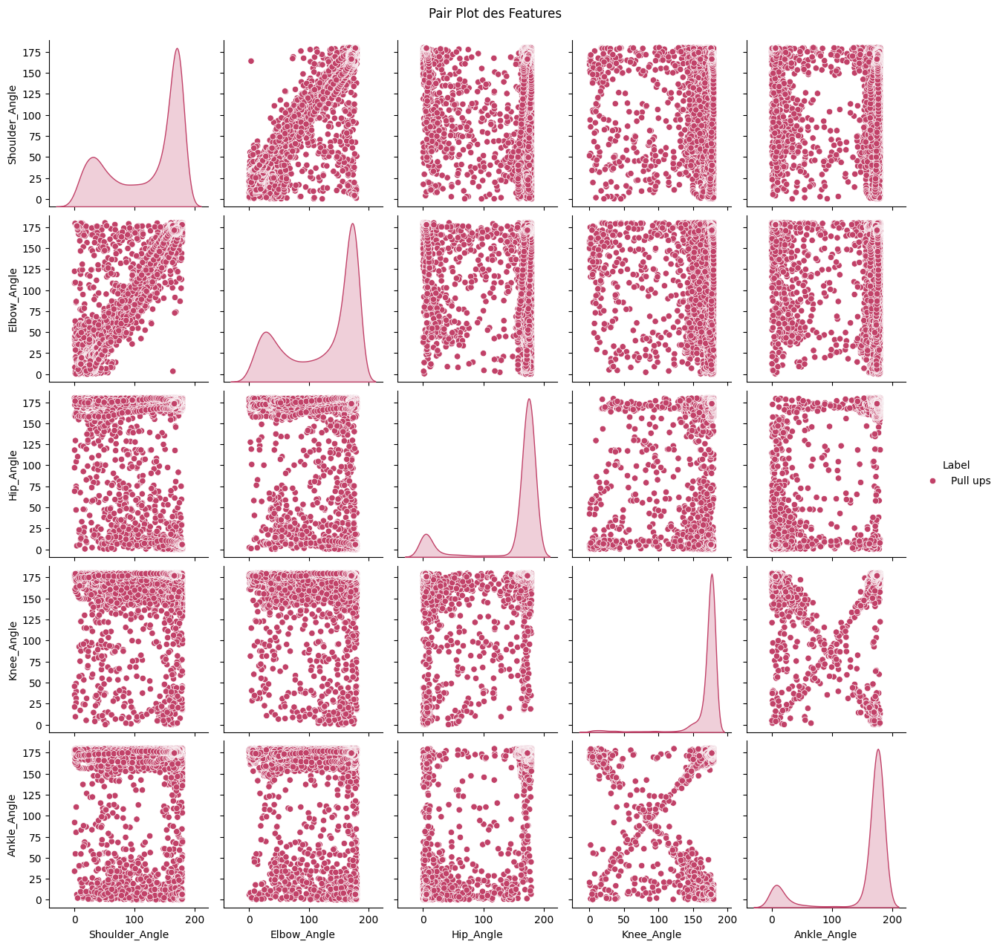

In [ ]:
df_jumping = df[df['Label'] == 'Pull ups']

sns.pairplot(df_jumping, vars=['Shoulder_Angle', 'Elbow_Angle', 'Hip_Angle', 'Knee_Angle', 'Ankle_Angle'], hue='Label', palette='flare')
plt.suptitle('Pair Plot des Features', y=1.02)
plt.show()

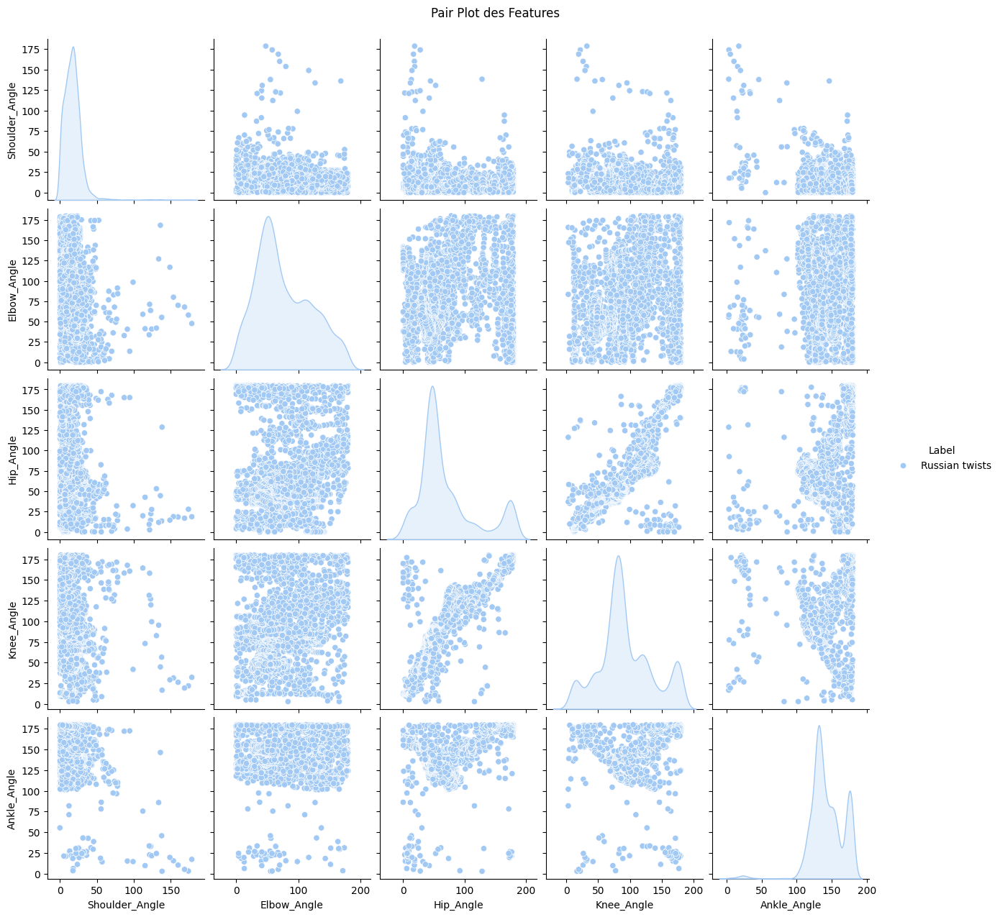

In [ ]:
df_jumping = df[df['Label'] == 'Russian twists']

sns.pairplot(df_jumping, vars=['Shoulder_Angle', 'Elbow_Angle', 'Hip_Angle', 'Knee_Angle', 'Ankle_Angle'], hue='Label', palette='pastel')
plt.suptitle('Pair Plot des Features', y=1.02)
plt.show()

### **Processing**

#### 2.3 Feature Building

Une fois les dépendances analysées, nous pouvons procéder à la création de nouvelles variables. Par exemple, des ratios, des moyennes, des différences ou encore des sommes. Cela permet d'apporter des nouvelles relations interessantes pour enrichir le dataframe.

Ci-dessous des exemples pertinents de nouvelles variables créées. Notamment en insistant sur les différentes parties du corps, d'une part le haut et d'autre part le bas.

In [ ]:
df['Mean_Angle'] = df[['Shoulder_Angle', 'Elbow_Angle', 'Hip_Angle', 'Knee_Angle', 'Ankle_Angle']].mean(axis=1)

df['Shoulder_to_Elbow_Ratio'] = df['Shoulder_Angle'] / (df['Elbow_Angle'] + 180)
df['Hip_to_Knee_Ratio'] = df['Hip_Angle'] / (df['Knee_Angle'] + 180)
df['Knee_to_Ankle_Ratio'] = df['Knee_Angle'] / (df['Ankle_Angle'] + 180)
# on a ajouté le 180 pour éviter les divisions par 0 et normaliser les valeurs entre 0 et 1

df['Shoulder_Elbow_Diff'] = df['Shoulder_Angle'] - df['Elbow_Angle']
df['Hip_Knee_Diff'] = df['Hip_Angle'] - df['Knee_Angle']
df['Knee_Ankle_Diff'] = df['Knee_Angle'] - df['Ankle_Angle']

df['Leg_Angle_Sum'] = df['Hip_Angle'] + df['Knee_Angle'] + df['Ankle_Angle']
df['Arm_Angle_Sum'] = df['Shoulder_Angle'] + df['Elbow_Angle']

On peut maintenant visualiser ces nouvelles variables comme nous l'avons fait précédemment.

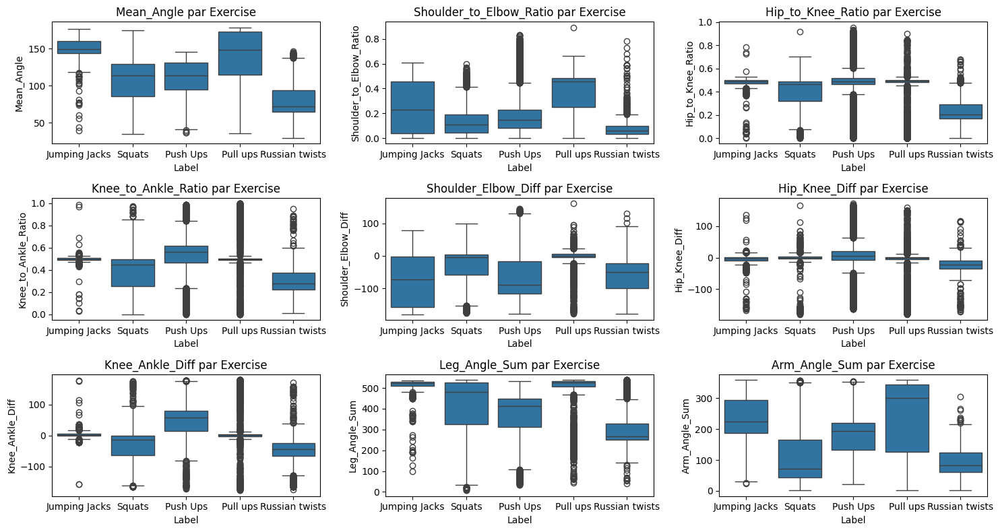

In [ ]:
columns_new_features = ['Mean_Angle', 'Shoulder_to_Elbow_Ratio', 'Hip_to_Knee_Ratio', 'Knee_to_Ankle_Ratio', 'Shoulder_Elbow_Diff', 'Hip_Knee_Diff', 'Knee_Ankle_Diff', 'Leg_Angle_Sum', 'Arm_Angle_Sum']

plt.figure(figsize=(15, 8))
for column in columns_new_features:
    plt.subplot(3, 3, list(columns_new_features).index(column) + 1)
    sns.boxplot(x='Label', y=column, data=df)
    plt.title(f'{column} par Exercise')
plt.tight_layout()
plt.show()

Elles apportent en effet des nouvelles relations intéressantes et permettent de différencier davantage les différents exercices entre eux.

Enfin, comme nous l'avons vu en cours, nous pouvons normaliser les données, car les modèles fonctionnent généralement mieux avec des valeurs comprises entre 0 et 1.

In [ ]:
#scaler = MinMaxScaler()
scaler = StandardScaler()

df_numeric = df.select_dtypes(include=['float64', 'int64'])

data_scaled = df.copy()
data_scaled[df_numeric.columns] = scaler.fit_transform(df_numeric)


## <span style="color:orange"> **3 - T-SNE et Evaluation**

L'objectif du `t-SNE` est de réduire les dimensions des données et de visualiser les clusters. Ici, nous devons répondre à "Pourquoi utiliser t-SNE et quelles sont ses limites ?".

### 3.1 - Visualisation de la donnée initial

Nous allons commencer par appliquer le t-SNE directement sur les données brutes pour observer les clusters potentiels d’exercices.

In [ ]:
data_selected = data_scaled[['Shoulder_Angle', 'Elbow_Angle', 'Hip_Angle', 'Knee_Angle', 'Ankle_Angle']]
exercises_data = data_scaled['Label']

In [ ]:
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(data_selected)

Afin de comparer les résultats de t-SNE, nous utiliserons l'indice de silouhette, qui est un indicateur compris entre 0 et 1 et qui précise à quel point les clusters sont bien séparés les uns des autres (0: mal séparés, 1: très beaux clusters :) ).

In [ ]:
labels = df['Label']

# Calcul de l'indice de silhouette
silhouette = silhouette_score(tsne_results, labels)
print(f"Indice de silhouette: {silhouette}")


Indice de silhouette: 0.07755592465400696


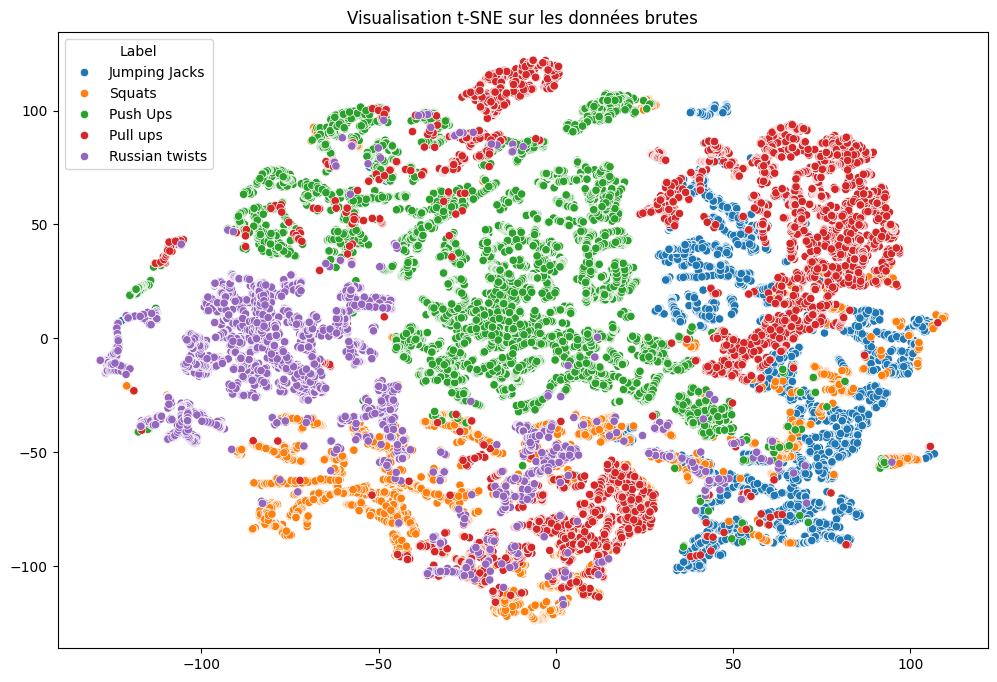

In [ ]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x=tsne_results[:,0], y=tsne_results[:,1], hue=df['Label'])
plt.title('Visualisation t-SNE sur les données brutes')
plt.show()

Avec un rapide aperçu, on remarque déjà plusieurs clusters mais il y a beaucoup de chevauchements entre eux. Nous allons voir dans un premier temps l'impact des hyperparamètres.

#### Utilisation du PCA

Nous allons appliquer des techniques de nettoyage et de réduction de dimension, comme le `PCA`, afin d'optimiser la visualisation t-SNE et d'augmenter légèrement la vitesse de calcul.

In [ ]:
percent_of_components = 0.9

# Application du PCA
pca = PCA(n_components=percent_of_components, random_state=42)
data_pca = pca.fit_transform(data_selected)

tsne = TSNE(n_components=2, random_state=42)
tsne_results_pca = tsne.fit_transform(data_pca)

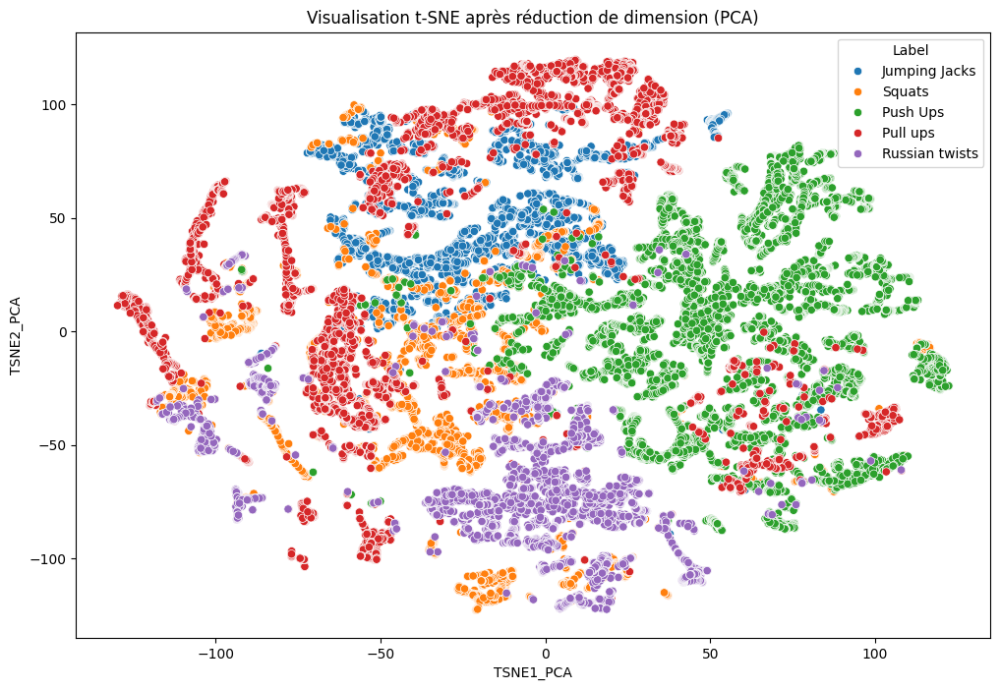

In [ ]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x=tsne_results_pca[:,0], y=tsne_results_pca[:,1], hue=df['Label'])
plt.title('Visualisation t-SNE après réduction de dimension (PCA)')
plt.show()

In [ ]:
silhouette = silhouette_score(tsne_results_pca, labels)
print(f"Indice de silhouette: {silhouette}")

Indice de silhouette: 0.06909503042697906


Le PCA conserve ici 90 % des composantes qui transmettent l'information. Cependant, les scores de silhouette semblent indiquer une performance moins bonne et la visualisation sur le graphique semble similaire à celle obtenue avec t-SNE.

#### Le paramètre perplexity

Quand on lit la documentation de sckit-learn sur le t-SNE, on apprend qu'un paramètre important à considérer est `perplexity` (le nombre de voisin). La valeur de ce paramètre peut entraîner des résultats très différents. Nous allons essayer ci-dessous 4 valeurs : 5, 30 (valeur par défaut), 50 et 100.

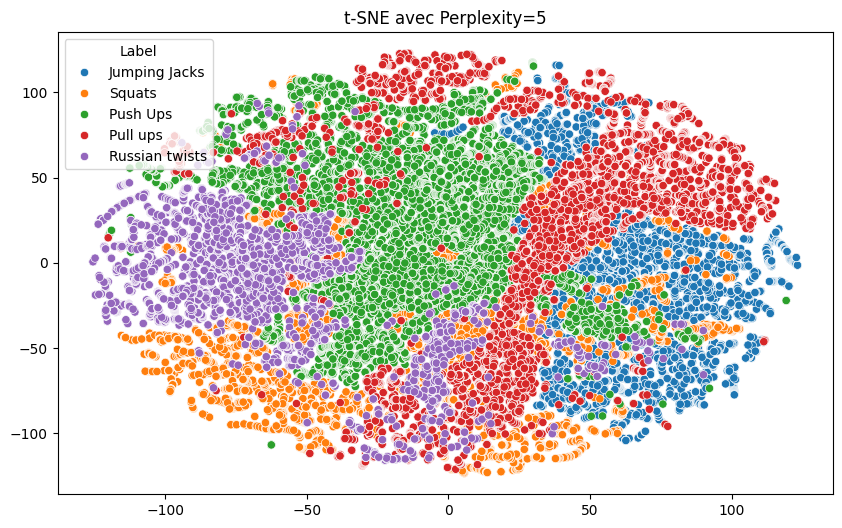

Indice de silhouette: 0.04850732535123825


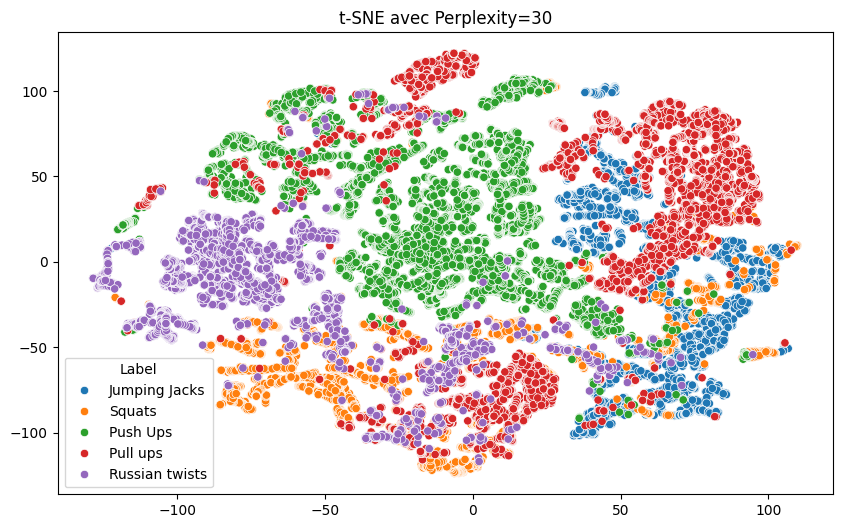

Indice de silhouette: 0.07755592465400696


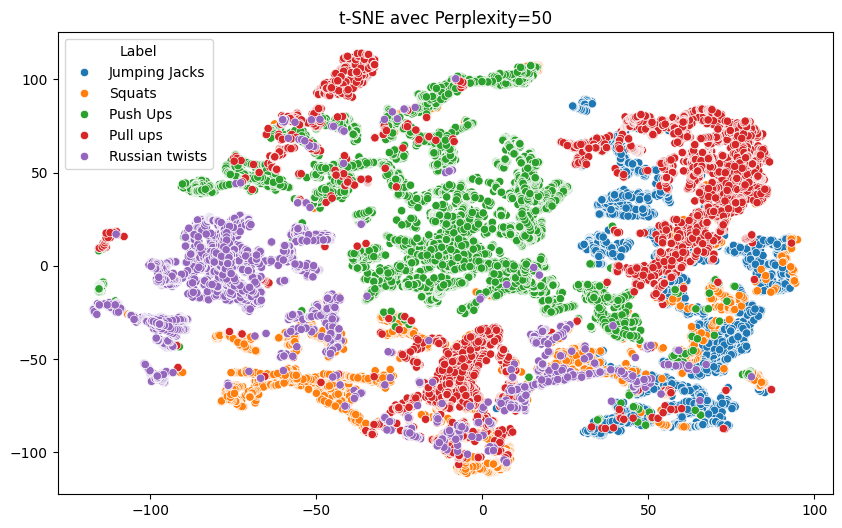

Indice de silhouette: 0.08003299683332443


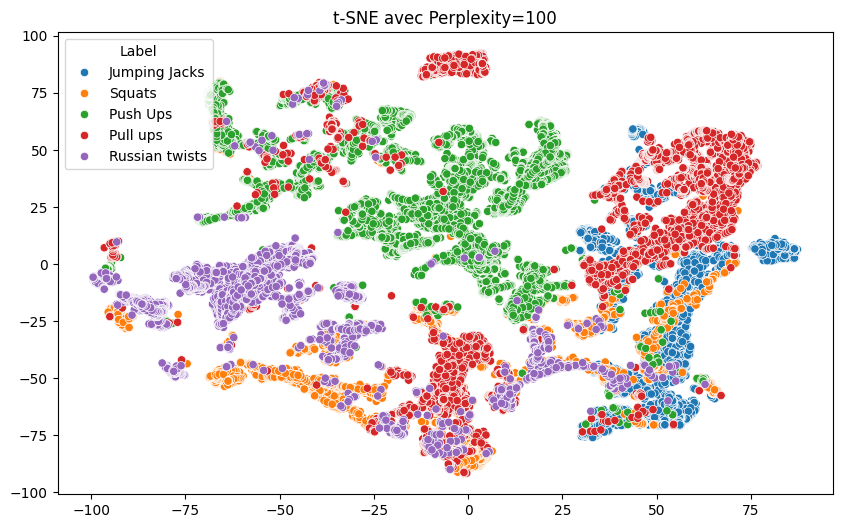

Indice de silhouette: 0.11052627861499786


In [ ]:
# Exemples de t-SNE avec différents perplexities
for perplexity in [5, 30, 50, 100]:

    tsne = TSNE(perplexity=perplexity, random_state=42)
    tsne_results = tsne.fit_transform(data_selected)

    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=tsne_results[:,0], y=tsne_results[:,1], hue=df['Label'])
    plt.title(f"t-SNE avec Perplexity={perplexity}")
    plt.show()

    labels = df['Label']

    # Calcul de l'indice de silhouette
    silhouette = silhouette_score(tsne_results, labels)
    print(f"Indice de silhouette: {silhouette}")

Des clusters sont mieux formés avec un paramètre plus élevé que la valeur par défaut. Notamment pour la valeur à 100 où l'indice de silouhette atteint 0.11. Cependant, on constate que les clusters sont visuellement plus regroupés quand la valeur de perplexity est grande, ce qui entraîne davantage de chevauchements.

### 3.2 Visualisation avec sélection des variables

On peut maintenant s'amuser à sélectionner plusieurs variables pour le calcul de t-SNE et voir si cela améliore les résultats.

In [ ]:
def tsne_plot(dataframe, features, label, title = '', perplexity = 30):
    data_selected = dataframe[features]
    exercises_data = dataframe[label]

    tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity)
    tsne_results = tsne.fit_transform(data_selected)

    plt.figure(figsize=(12, 8))
    sns.scatterplot(x=tsne_results[:,0], y=tsne_results[:,1], hue=exercises_data)
    plt.title('Visualisation t-SNE ' + title)
    plt.show()

    labels = dataframe[label]

    # Calcul de l'indice de silhouette
    silhouette = silhouette_score(tsne_results, labels)
    print(f"Indice de silhouette: {silhouette}")

#### Avec toutes les features de base

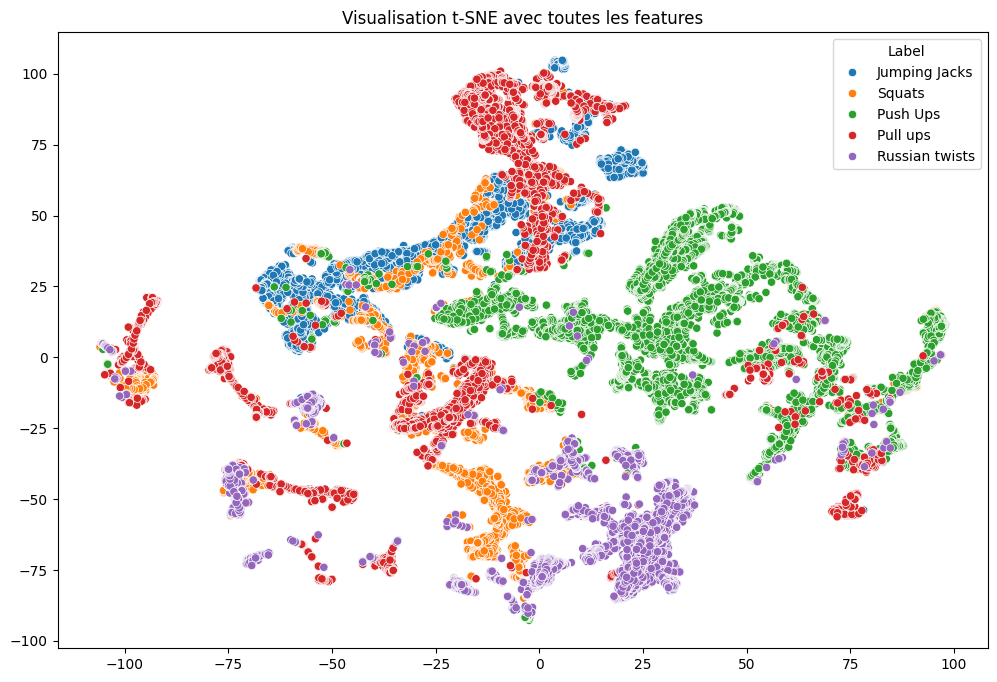

Indice de silhouette: 0.10604521632194519


In [ ]:
tsne_plot(df,
          ['Shoulder_Angle',
           'Elbow_Angle',
           'Hip_Angle',
           'Knee_Angle',
           'Ankle_Angle',
           'Shoulder_Ground_Angle',
           'Elbow_Ground_Angle',
           'Hip_Ground_Angle',
           'Knee_Ground_Angle',
           'Ankle_Ground_Angle'],
         'Label',
         'avec toutes les features',
         perplexity=100
        )

#### Avec seulement quelques features

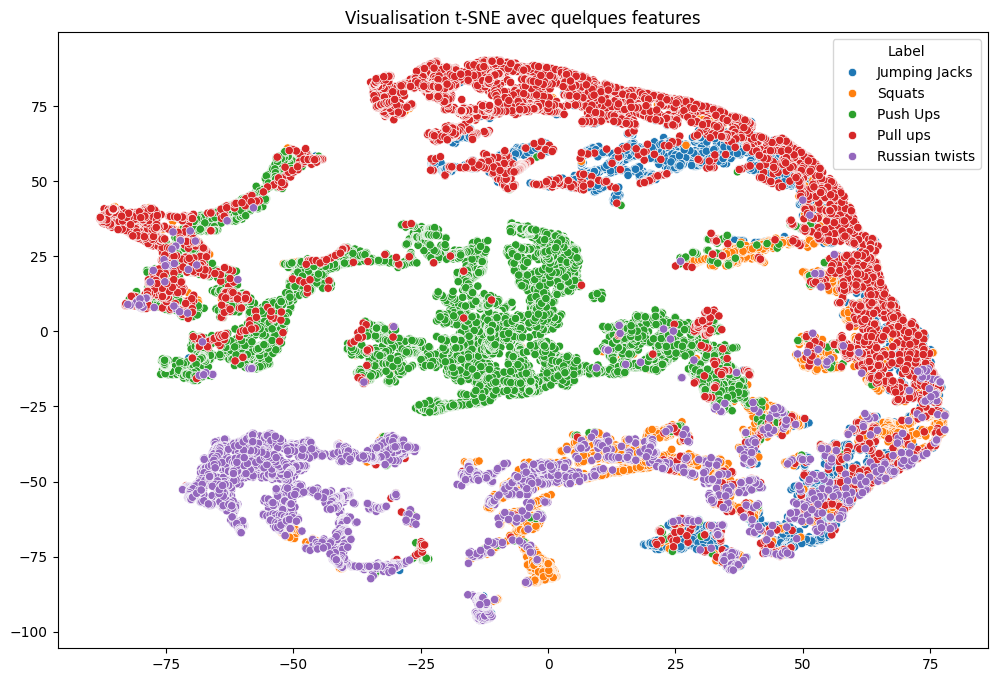

Indice de silhouette: 0.07474689185619354


In [ ]:
tsne_plot(df,
          ['Shoulder_Angle',
           'Hip_Angle',
           'Ankle_Angle'],
         'Label',
         'avec quelques features',
         perplexity=100
        )

#### Avec les features de base (sans grounds) et les features supplémentaires

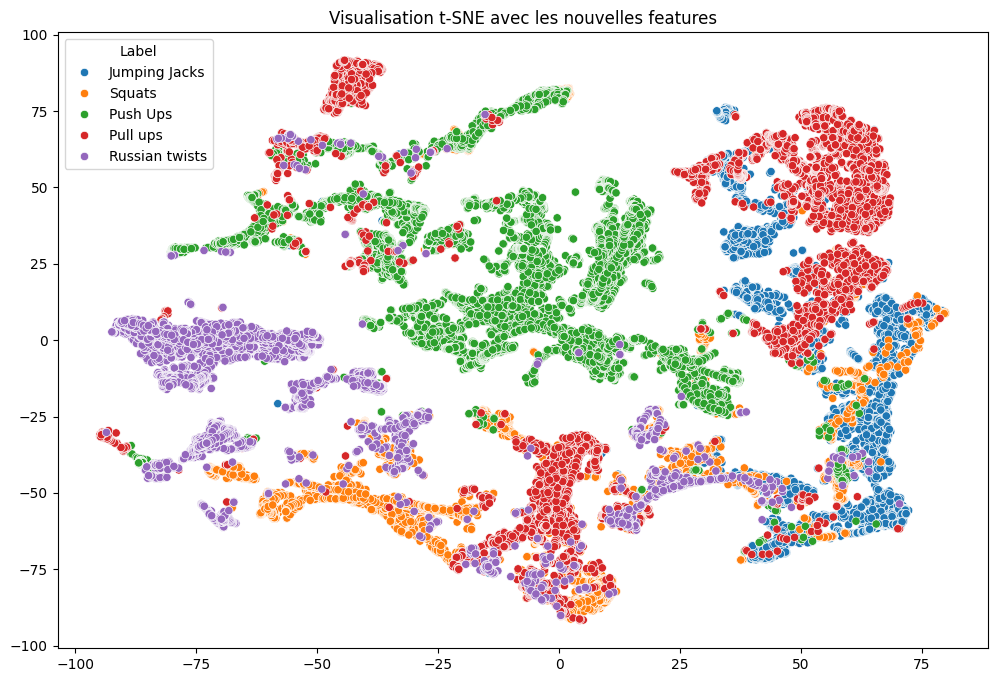

Indice de silhouette: 0.10323874652385712


In [ ]:
tsne_plot(df,
          ['Shoulder_Angle',
          'Elbow_Angle',
          'Hip_Angle',
          'Knee_Angle',
          'Ankle_Angle',
          'Mean_Angle',
          'Shoulder_to_Elbow_Ratio',
          'Hip_to_Knee_Ratio',
          'Knee_to_Ankle_Ratio',
          'Shoulder_Elbow_Diff',
          'Hip_Knee_Diff',
          'Knee_Ankle_Diff',
          'Leg_Angle_Sum',
          'Arm_Angle_Sum'],

         'Label',
         'avec les nouvelles features',
         perplexity=100
        )

#### Avec toutes les features et les features supplémentaires

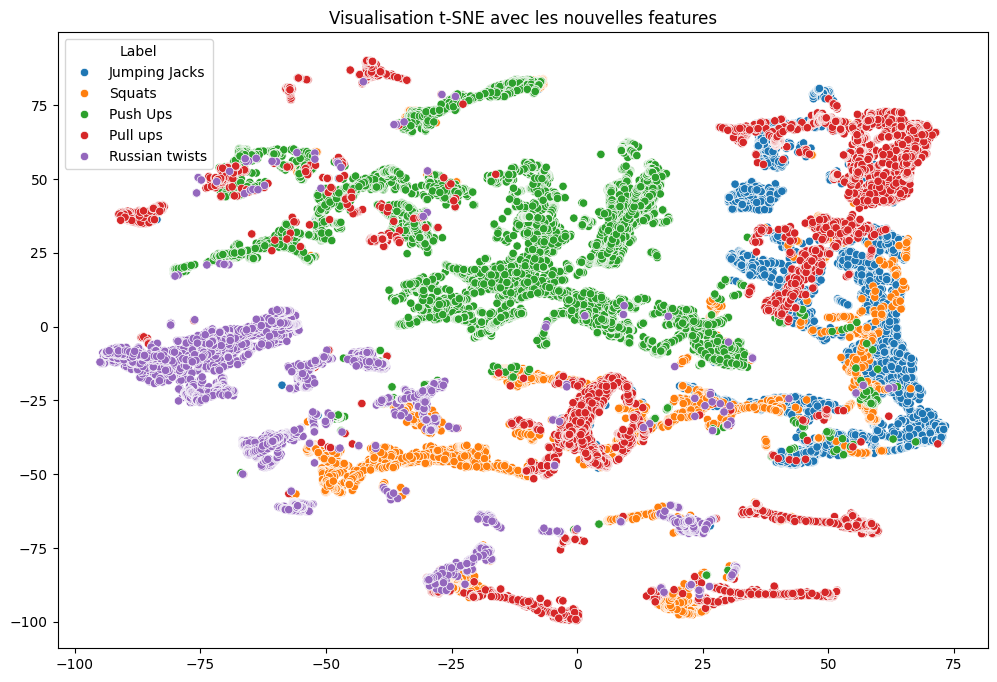

Indice de silhouette: 0.10195739567279816


In [ ]:
tsne_plot(df,
          ['Shoulder_Angle',
          'Elbow_Angle',
          'Hip_Angle',
          'Knee_Angle',
          'Ankle_Angle',
          'Shoulder_Ground_Angle',
          'Elbow_Ground_Angle',
          'Hip_Ground_Angle',
          'Knee_Ground_Angle',
          'Ankle_Ground_Angle',
          'Mean_Angle',
          'Shoulder_to_Elbow_Ratio',
          'Hip_to_Knee_Ratio',
          'Knee_to_Ankle_Ratio',
          'Shoulder_Elbow_Diff',
          'Hip_Knee_Diff',
          'Knee_Ankle_Diff',
          'Leg_Angle_Sum',
          'Arm_Angle_Sum'],

         'Label',
         'avec les nouvelles features',
         perplexity=100
        )

Ils sembleraient que plus il y a de feature et plus les résultats sont corrects.

## <span style="color:orange"> **4 - (bonus) Classification ML**

Dans cette section bonus, nous allons tester les différents modèles de Machine Learning pour la classification des exercices : Le `Random Forest` et le `KNN`. Le premier car c'est un modèle très connu qui se prête particulièrement bien pour cet exercice. Le deuxième car nous l'avons mis en oeuvre plusieurs fois dans le cadre des projets et qu'il est pertinent de comparer les performances avec un deuxième modèle.

### Sans les nouvelles features

In [ ]:
X = df[['Shoulder_Angle',
          'Elbow_Angle',
          'Hip_Angle',
          'Knee_Angle',
          'Ankle_Angle',
          'Shoulder_Ground_Angle',
          'Elbow_Ground_Angle',
          'Hip_Ground_Angle',
          'Knee_Ground_Angle',
          'Ankle_Ground_Angle']]

y = df['Label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Standardisation des données (Random Forest ne le nécessite pas, mais c'est requis pour KNN)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#### 4.1 Random Forest

In [ ]:
rf_model = RandomForestClassifier(random_state=1)
rf_model.fit(X_train, y_train)

y_pred_rf = rf_model.predict(X_test)

accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f"Random Forest Accuracy: {accuracy_rf * 100:.2f}%")

Random Forest Accuracy: 96.49%


#### 4.2 KNN

In [ ]:
# Construction du modèle KNN
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train_scaled, y_train)

# Prédiction sur les données de test
y_pred_knn = knn_model.predict(X_test_scaled)

# Calcul du score de précision
accuracy_knn = accuracy_score(y_test, y_pred_knn)
print(f"KNN Accuracy: {accuracy_knn * 100:.2f}%")

KNN Accuracy: 96.25%


Les précisions sont déjà avec des valeurs très correctes bien que ce ne soit que sur les valeurs initalement créées. On va donc voir si des données supplémentaires peuvent augmenter la précision.

### Avec les nouvelles features

Cette fois-ci  nous mettons toutes les variables créées dans ce notebook.

In [ ]:
X = df[['Shoulder_Angle',
          'Elbow_Angle',
          'Hip_Angle',
          'Knee_Angle',
          'Ankle_Angle',
          'Shoulder_Ground_Angle',
          'Elbow_Ground_Angle',
          'Hip_Ground_Angle',
          'Knee_Ground_Angle',
          'Ankle_Ground_Angle',
          'Mean_Angle',
          'Shoulder_to_Elbow_Ratio',
          'Hip_to_Knee_Ratio',
          'Knee_to_Ankle_Ratio',
          'Shoulder_Elbow_Diff',
          'Hip_Knee_Diff',
          'Knee_Ankle_Diff',
          'Leg_Angle_Sum',
          'Arm_Angle_Sum']]

y = df['Label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Standardisation des données (Random Forest ne le nécessite pas, mais c'est requis pour KNN)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#### 4.3 Random Forest amélioré

In [ ]:
rf_model = RandomForestClassifier(random_state=1)
rf_model.fit(X_train, y_train)

y_pred_rf = rf_model.predict(X_test)

accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f"Random Forest Accuracy: {accuracy_rf * 100:.2f}%")


Random Forest Accuracy: 97.39%


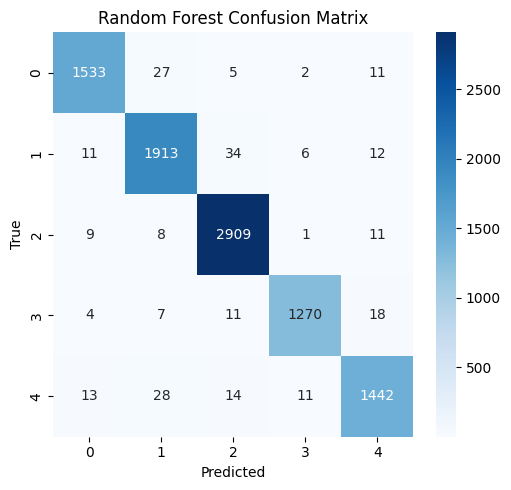

In [ ]:
confusion_rf = confusion_matrix(y_test, y_pred_rf)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
sns.heatmap(confusion_rf, annot=True, fmt='d', cmap='Blues')
plt.title("Random Forest Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")

plt.tight_layout()
plt.show()


La matrice de confusion confirme les premières estimations en partie 1. Les pushs ups (valeur 2) sont très bien classés. En revanche, la difficulté se trouve sur le twist russe (valeur 4) qui serait donc un axe potentiel d'amélioration.

C:\Users\remij\AppData\Local\Temp\ipykernel_23732\2616285693.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=feature_importances, x='Importance', y='Feature', palette='viridis')


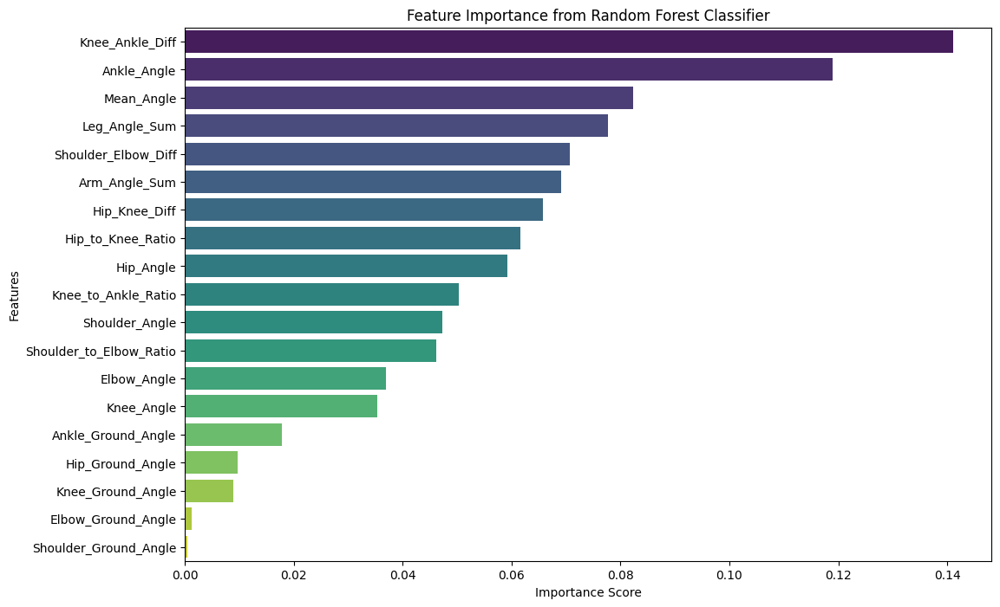

In [ ]:
importances = rf_model.feature_importances_
feature_names = X.columns
feature_importances = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
})

feature_importances = feature_importances.sort_values(by='Importance', ascending=False)


plt.figure(figsize=(12, 8))
sns.barplot(data=feature_importances, x='Importance', y='Feature', palette='viridis')
plt.title('Feature Importance from Random Forest Classifier')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.show()

Encore une fois cela confirme nos prédictions : les valeurs associées au sol ne sont pas si importantes pour la classification. En revanche, les nouvelles  variables créées en feature building contribuent de manière significative à la classification.

In [ ]:
print("Random Forest Classification Report")
print(classification_report(y_test, y_pred_rf))

Random Forest Classification Report
                precision    recall  f1-score   support

 Jumping Jacks       0.98      0.97      0.97      1578
      Pull ups       0.96      0.97      0.97      1976
      Push Ups       0.98      0.99      0.98      2938
Russian twists       0.98      0.97      0.98      1310
        Squats       0.97      0.96      0.96      1508

      accuracy                           0.97      9310
     macro avg       0.97      0.97      0.97      9310
  weighted avg       0.97      0.97      0.97      9310



#### 4.4 KNN amélioré

In [ ]:
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train_scaled, y_train)

y_pred_knn = knn_model.predict(X_test_scaled)

accuracy_knn = accuracy_score(y_test, y_pred_knn)
print(f"KNN Accuracy: {accuracy_knn * 100:.2f}%")

KNN Accuracy: 96.21%


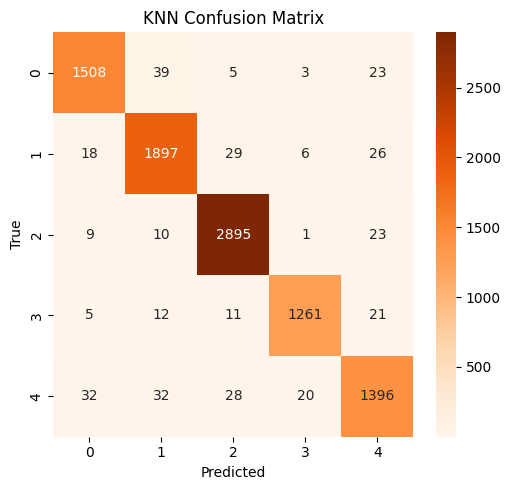

In [ ]:
# Matrice de confusion pour KNN
confusion_knn = confusion_matrix(y_test, y_pred_knn)

plt.figure(figsize=(10, 5))

# Affichage de la matrice de confusion pour KNN
plt.subplot(1, 2, 2)
sns.heatmap(confusion_knn, annot=True, fmt='d', cmap='Oranges')
plt.title("KNN Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")

plt.tight_layout()
plt.show()


On retrouve des valeurs similaires au Random Forest.

### Conclusion des modèles

Bien que les performances soient déjà élevées, la précision du modèle `Random Forest` a pu être améliorée, passant de 96 % à 97 %, réduisant ainsi les erreurs de 25 %, grâce notamment à la création de nouvelles variables et à l'analyse réalisée en amont.

Cependant, ces nouvelles variables n'ont pas permis d'améliorer les résultats du `KNN`, qui repose sur la distance entre les voisins de chaque point. Cela peut s'expliquer par la troisième partie du notebook, où nous avons observé que ces nouvelles variables n'amélioraient pas significativement la séparation des clusters.

Pour aller plus loin, il serait pertinent de créer des variables supplémentaires basées sur la signification réelle des données. Il pourrait aussi être utile de demander l'avis d'un expert pour mieux comprendre les subtilités et les interprétations cachées derrière ces données.